<a href="https://colab.research.google.com/github/Jiang15/fashion-gan/blob/master/Explore_latent_space.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd /content/drive/MyDrive/stylegan2-ada-pytorch

/content/drive/MyDrive/stylegan2-ada-pytorch


In [2]:


!pip install torch==1.8.0+cu111 torchvision==0.9.0+cu111 torchaudio==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
ERROR: Could not find a version that satisfies the requirement torch==1.8.0+cu111 (from versions: 1.11.0, 1.11.0+cpu, 1.11.0+cu102, 1.11.0+cu113, 1.11.0+cu115, 1.11.0+rocm4.3.1, 1.11.0+rocm4.5.2, 1.12.0, 1.12.0+cpu, 1.12.0+cu102, 1.12.0+cu113, 1.12.0+cu116, 1.12.0+rocm5.0, 1.12.0+rocm5.1.1, 1.12.1, 1.12.1+cpu, 1.12.1+cu102, 1.12.1+cu113, 1.12.1+cu116, 1.12.1+rocm5.0, 1.12.1+rocm5.1.1, 1.13.0, 1.13.0+cpu, 1.13.0+cu116, 1.13.0+cu117, 1.13.0+cu117.with.pypi.cudnn, 1.13.0+rocm5.1.1, 1.13.0+rocm5.2, 1.13.1, 1.13.1+cpu, 1.13.1+cu116, 1.13.1+cu117, 1.13.1+cu117.with.pypi.cudnn, 1.13.1+rocm5.1.1, 1.13.1+rocm5.2, 2.0.0, 2.0.0+cpu, 2.0.0+cpu.cxx11.abi, 2.0.0+cu117, 2.0.0+cu117.with.pypi.cudnn, 2.0.0+cu118, 2.0.0+rocm5.3, 2.0.0+rocm5.4.2, 2.0.1, 2.0.1+cpu, 2.0.1+cpu.cxx11.abi, 2.0.1+cu117, 2.0.1+cu117.with.pypi.cudnn, 2.0.1+cu118, 2.0.1+rocm5.3, 2.0.1+rocm5.4.2, 2.1.0+cpu, 2.1.0+cpu.cxx11.abi, 2.1.0+cu118, 2.1.0+cu121, 2.1.0+cu1

In [3]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [ ]:
# Upgrade CUDA to 11.2
!sudo apt-get upgrade cuda
!apt --fix-broken install
# # Needed so plugins compile successfully
# !pip install ninja

E: Could not get lock /var/lib/dpkg/lock-frontend. It is held by process 2040 (apt-get)
N: Be aware that removing the lock file is not a solution and may break your system.
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), is another process using it?
Waiting for cache lock: Could not get lock /var/lib/dpkg/lock-frontend. It is held by process 2040 (apt-get)      
Waiting for cache lock: Could not get lock /var/lib/dpkg/lock-frontend. It is held by process 2040 (apt-get)      
Waiting for cache lock: Could not get lock /var/lib/dpkg/lock-frontend. It is held by process 2040 (apt-get)      
Waiting for cache lock: Could not get lock /var/lib/dpkg/lock-frontend. It is held by process 2040 (apt-get)      
Waiting for cache lock: Could not get lock /var/lib/dpkg/lock-frontend. It is held by process 2040 (apt-get)      
^C


In [4]:
!pip install ninja

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 3.4 MB/s eta 0:00:00


In [5]:
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import PIL
import torch
import dnnlib
import legacy
from style_mixing import *
import imageio
from sklearn.preprocessing import StandardScaler
from helpers import *

In [6]:
#network = "/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/training_runs/00011-square_256_imgs-auto1-resumecustom/network-snapshot-004080.pkl"
network = "/content/drive/MyDrive/stylegan2-ada-pytorch/training_runs/00015-square_256_imgs-auto1-resumecustom/network-snapshot-000400.pkl"

1. function of taking a random noise vector to generate an image

In [7]:
# load network
device = torch.device('cuda')
with dnnlib.util.open_url(network) as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device) # type: ignore

### PCA for finding resonable direction

In [8]:
seed = 0
z = generateZ_from_seed(seed, G)
w, img = generate_image_from_z(z, G)
# get N number of w
N = 5000
for seed in np.arange(1, N):
    z = generateZ_from_seed(seed, G)
    w_seed, img = generate_image_from_z(z, G)
    w = np.concatenate((w, w_seed), axis=0)

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


Covariance matrix

In [9]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(w)

PCA()

In [10]:
vectors = pca.components_
variances = pca.explained_variance_ratio_

In [ ]:
#np.save("out/vectors.npy", vectors)
vectors = np.load('out/vectors.npy')

Now we explore the changes in different directions and layers.  
For example, in the first dierection, 0-4 controls the length of the sleeves, 7-14 controls the color.

In [11]:
import copy
import os
from time import perf_counter

import click
import imageio
import numpy as np
import PIL.Image
import torch
import torch.nn.functional as F

import dnnlib
import legacy

def project(
    G,
    target: torch.Tensor, # [C,H,W] and dynamic range [0,255], W & H must match G output resolution
    *,
    num_steps                  = 1000,
    w_avg_samples              = 10000,
    initial_learning_rate      = 0.1,
    initial_noise_factor       = 0.01,
    lr_rampdown_length         = 0.25,
    lr_rampup_length           = 0.05,
    noise_ramp_length          = 0.75,
    regularize_noise_weight    = 1e6,
    verbose                    = False,
    device: torch.device,
    mode = "avg"
):
    assert target.shape == (G.img_channels, G.img_resolution, G.img_resolution)

    def logprint(*args):
        if verbose:
            print(*args)

    G = copy.deepcopy(G).eval().requires_grad_(False).to(device) # type: ignore

    # Compute w stats.
    if mode == "avg":

        w_avg = np.load("w_avg.npy")
        w_std = np.load("w_std.npy")

    if mode == "random":
        w_avg_samples = 1
        initial_learning_rate      = 0.1
        z_samples = np.random.RandomState(123).randn(w_avg_samples, G.z_dim)
        w_samples = G.mapping(torch.from_numpy(z_samples).to(device), None)  # [N, L, C]
        w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)       # [N, 1, C]
        w_avg = np.mean(w_samples, axis=0, keepdims=True)      # [1, 1, C]
        w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5
    # Setup noise inputs.
    noise_bufs = { name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }

    # Load VGG16 feature detector.
    vgg16 = torch.jit.load("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/model/vgg16.pt")
    print("model prepared")
    # Features for target image.
    target_images = target.unsqueeze(0).to(device).to(torch.float32)
    if target_images.shape[2] > 256:
        target_images = F.interpolate(target_images, size=(256, 256), mode='area')
    target_features = vgg16(target_images, resize_images=False, return_lpips=True)

    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=True) # pylint: disable=not-callable
    w_out = torch.zeros([num_steps] + list(w_opt.shape[1:]), dtype=torch.float32, device=device)
    optimizer = torch.optim.Adam([w_opt] + list(noise_bufs.values()), betas=(0.9, 0.999), lr=initial_learning_rate)

    # Init noise.
    for buf in noise_bufs.values():
        buf[:] = torch.randn_like(buf)
        buf.requires_grad = True
    print("start sgd")
    lr = initial_learning_rate
    for step in range(num_steps):
        # Learning rate schedule.
        t = step / num_steps
        w_noise_scale = w_std * initial_noise_factor * max(0.0, 1.0 - t / noise_ramp_length) ** 2
        lr_ramp = min(1.0, (1.0 - t) / lr_rampdown_length)
        lr_ramp = 0.5 - 0.5 * np.cos(lr_ramp * np.pi)
        lr_ramp = lr_ramp * min(1.0, t / lr_rampup_length)


        for param_group in optimizer.param_groups:
            param_group['lr'] = lr

        # Synth images from opt_w.
        w_noise = torch.randn_like(w_opt) * w_noise_scale
        ws = (w_opt + w_noise).repeat([1, G.mapping.num_ws, 1])
        synth_images = G.synthesis(ws, noise_mode='const')

        # Downsample image to 256x256 if it's larger than that. VGG was built for 224x224 images.
        synth_images = (synth_images + 1) * (255/2)
        if synth_images.shape[2] > 256:
            synth_images = F.interpolate(synth_images, size=(256, 256), mode='area')

        # Features for synth images.
        synth_features = vgg16(synth_images, resize_images=False, return_lpips=True)
        dist = (target_features - synth_features).square().sum()
        #dist = loss_fn_vgg(target_images, synth_images)[0][0][0][0].item()
        pairwise_loss = (synth_images - target_images).square().mean()

        # Noise regularization.
        reg_loss = 0.0
        for v in noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        if mode =='avg':
            loss = dist + reg_loss * regularize_noise_weight +0.1*pairwise_loss
        else:
            loss = dist + reg_loss * regularize_noise_weight + pairwise_loss *0.5
        # print(dist, pairwise_loss, reg_loss)
        # if loss < 0.09:
        #     # logprint(f'step {step+1:>4d}/{num_steps}: dist {dist:<4.2f} loss {float(loss):<5.2f} pairwise loss {float(pairwise_loss):<5.2f}')

        #     return w_opt.detach()[0].repeat([1,G.mapping.num_ws, 1])
        # Step
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()
        # if step>1000:
        #     lr = initial_learning_rate/(step//1000)

        # Normalize noise.
        with torch.no_grad():
            for buf in noise_bufs.values():
                buf -= buf.mean()
                buf *= buf.square().mean().rsqrt()
    # logprint(f'step {step+1:>4d}/{num_steps}: dist {dist:<4.2f} loss {float(loss):<5.2f} pairwise loss {float(pairwise_loss):<5.2f}')
    print(dist, pairwise_loss)
        # Save projected W for each optimization step.

    return w_opt.detach()[0].repeat([1, G.mapping.num_ws, 1])
# project image to w

def img_to_w(target_pil, G, num_steps=3000, device = 'cuda', mode = "avg"):
    w, h = target_pil.size
    s = min(w, h)
    target_pil = target_pil.crop(((w - s) // 2, (h - s) // 2, (w + s) // 2, (h + s) // 2))
    target_pil = target_pil.resize((G.img_resolution, G.img_resolution), PIL.Image.LANCZOS)
    target_uint8 = np.array(target_pil, dtype=np.uint8)
    projected_w = project(
        G,
        target=torch.tensor(target_uint8.transpose([2, 0, 1]), device=device), # pylint: disable=not-callable
        num_steps=num_steps,
        device=torch.device('cuda'),
        verbose=True
    )
    return projected_w[-1].unsqueeze(0)

In [12]:
def visualize_two_magnititue(G, vectors,  direction_ind, layers, mag):
    fig, axs = plt.subplots(len(mag[0]), len(mag[0]), figsize=(3*len(mag[0]),3*len(mag[0])))
    seed = random.randint(1,100)
    seed = 85
    z = generateZ_from_seed(seed, G)
    w_origin = generate_w(z, G)
    # get original w
    print(seed)
    print(mag)
    for ind_x in range(len(mag[0])):
        for ind_y in range(len(mag[0])):
            # get modified w
            w_tmp = E(vectors, direction_ind[0], [mag[0][ind_x]], layers[0], w_origin.cpu().numpy())
            w_modify = E(vectors, direction_ind[1], [mag[1][ind_y]], layers[1], w_tmp.cpu().numpy())

            img_modify = generate_image_from_w(w_modify, G)

            if mag[0][ind_x] == 0 and mag[1][ind_y] == 0:
                rect = Rectangle((0,0),255,255,linewidth=2,edgecolor='g',facecolor='none')
                # Add the patch to the Axes
                axs[ind_x,ind_y].add_patch(rect)
            axs[ind_x,ind_y].imshow(img_modify)
            axs[ind_x,ind_y].axis('off')
    plt.savefig("result/pca" + str(seed) + ".png")

85
[[-4, -2, 0, 3, 5], [-4, -2, 0, 2, 7]]


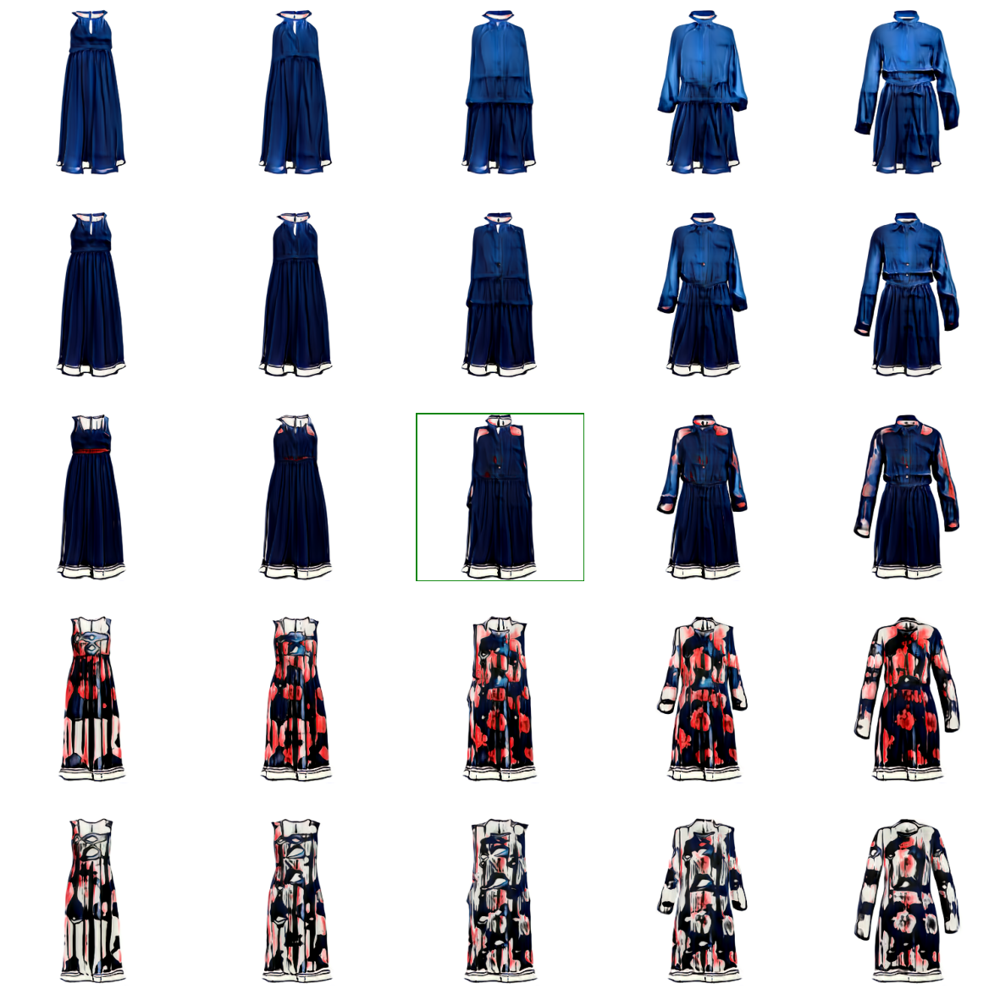

In [13]:
direction_ind = [[4], [0]]  # direction index
layers = [[np.arange(3,10,1)], [np.arange(0,4,1)]]  # layers for adding the vector
mag= [[-4, -2, 0, 3, 5], [-4, -2, 0, 2, 7]]
visualize_two_magnititue(G, vectors, direction_ind, layers, mag)

In [14]:
# visualize changes in 10 directions and 10 magnititude
def visualize_magnititue(G, vectors,  direction_ind, layers, magnititude = np.arange(-10, 10, 3)):
    fig, axs = plt.subplots(10, len(magnititude), figsize=(20, 40))
   # fig.suptitle("The "+ str(direction_ind[0]) + " component of PCA")
    for ind_x in range(10):
        seed = random.randint(1,100)
        z = generateZ_from_seed(seed, G)
        # get original w
        w_origin = generate_w(z, G)
        for ind_y, mag in enumerate(magnititude):
            # get modified w
            w_modify = E(vectors, direction_ind, [mag], layers, w_origin.cpu().numpy())
            img_modify = generate_image_from_w(w_modify, G)
            if mag == 0:
                rect = Rectangle((0,0),255,255,linewidth=2,edgecolor='g',facecolor='none')
                # Add the patch to the Axes
                axs[ind_x,ind_y].add_patch(rect)
            axs[ind_x,ind_y].imshow(img_modify)
            axs[ind_x,ind_y].axis('off')
            if ind_x ==0:
                axs[ind_x,ind_y].set_title(f"E({direction_ind[0]},{mag},({layers[0][0]+1},{layers[0][-1]+1}))")
    plt.savefig("result/pca/pca_direction" + str(direction_ind[0]) + str(layers[0][0]) + ".png")

In [15]:
import json
with open('static/output/dim_dic.txt') as fobj:
    dim_dic = json.load(fobj)
dim_dic

{'0': {'id': 0, 'layers': [0, 4], 'mag': [-10, 10], 'effect': 'sleeve'},
 '1': {'id': 4, 'layers': [3, 9], 'mag': [-10, 10], 'effect': 'pattern'},
 '2': {'id': 2,
  'layers': [0, 7],
  'mag': [-10, 10],
  'effect': 'collar, hemline, width'},
 '3': {'id': 6,
  'layers': [10, 14],
  'mag': [-20, 20],
  'effect': 'orange, blue'},
 '4': {'id': 0, 'layers': [10, 14], 'mag': [-30, 30], 'effect': 'Green, red'},
 '5': {'id': 7, 'layers': [10, 14], 'mag': [-40, 40], 'effect': 'dark, light'},
 '6': {'id': 9,
  'layers': [0, 4],
  'mag': [-10, 10],
  'effect': 'hemline, collar'},
 '7': {'id': 8, 'layers': [3, 4], 'mag': [-20, 20], 'effect': 'waistline'}}

In [16]:
 # visualize changes in 10 directions and 10 magnititude
def visualize_magnititue_img_in(G, vectors,  direction_ind, layers, magnititudes):
    fig, axs = plt.subplots(1, 7,figsize=(21,3))
   # fig.suptitle("The "+ str(direction_ind[0]) + " component of PCA")
    seed = random.randint(1,100)

    z = generateZ_from_seed(seed, G)
    # get original w
    print(seed)
    w_origin = generate_w(z, G)
    for ind_y, mag in enumerate(magnititudes):
        # get modified w
        w_modify = E(vectors, direction_ind, [mag], layers, w_origin.cpu().numpy())
        img_modify = generate_image_from_w(w_modify, G)
        if mag == 0:
            rect = Rectangle((0,0),255,255,linewidth=2,edgecolor='g',facecolor='none')
            # Add the patch to the Axes
            axs[ind_y].add_patch(rect)
        axs[ind_y].imshow(img_modify)
        axs[ind_y].axis('off')
        # if ind_x ==0:
        #     axs[ind_x,ind_y].set_title(f"E({direction_ind[0]},{mag},({layers[0][0]+1},{layers[0][-1]+1}))")
    plt.savefig("result/pca/pca_direction_in" + str(direction_ind[0]) + str(layers[0][0]) + ".png")

In [17]:
 # visualize changes in 10 directions and 10 magnititude
 import math
def visualize_magnititue_img_out(path, G, vectors,  direction_ind, layers, magnititudes):
    fig, axs = plt.subplots(1, 7,figsize=(21,3))
   # fig.suptitle("The "+ str(direction_ind[0]) + " component of PCA")
    num_steps = 3000
    img = PIL.Image.open(p).convert('RGB')
    width, height = img.size
    if width != 256 or height != 256:

        result = PIL.Image.new("RGB", (256, 256), (255, 255, 255))

        # Resize image
        img.thumbnail((256, 256))
        # compute center
        position_x = math.floor((256 - img.width) / 2)
        position_y = math.floor((256 - img.height) / 2)
        # Paste image into center of background
        result.paste(img, (position_x, position_y))
        img = result
    w_origin = img_to_w(img, G, num_steps = num_steps, mode = "avg")

    ind_x=0
    for ind_y, mag in enumerate(magnititudes):
        # get modified w
        w_modify = E(vectors, direction_ind, [mag], layers, w_origin.cpu().numpy())
        img_modify = generate_image_from_w(w_modify, G)
        if mag == 0:
            rect = Rectangle((0,0),255,255,linewidth=2,edgecolor='g',facecolor='none')
            # Add the patch to the Axes
            axs[ind_y].add_patch(rect)
        axs[ind_y].imshow(img_modify)
        axs[ind_y].axis('off')
        # if ind_x ==0:
        #     axs[ind_x,ind_y].set_title(f"E({direction_ind[0]},{mag},({layers[0][0]+1},{layers[0][-1]+1}))")
    plt.savefig("result/pca/pca_direction_out" + str(direction_ind[0]) + str(layers[0][0]) + ".png")

52


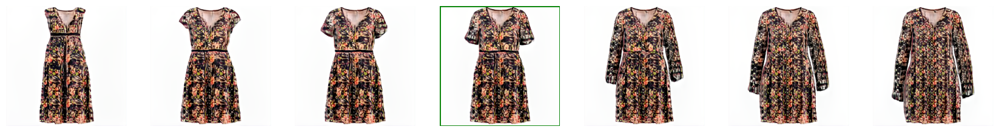

In [18]:
direction_ind = [0]  # direction index 67
layers = [np.arange(0,4,1)]  # layers for adding the vector
visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-7,-3,-1.5,0,3,5,7])

model prepared
start sgd
tensor(0.0416, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0137, device='cuda:0', grad_fn=<MeanBackward0>)


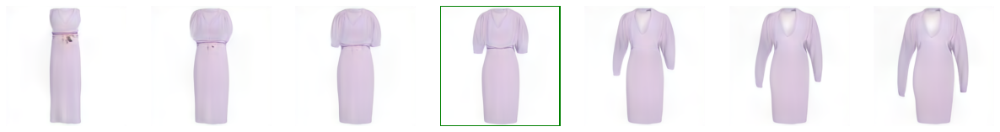

In [ ]:
direction_ind = [0]  # direction index
layers = [np.arange(0,4,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/lavendar_dress.png"
visualize_magnititue_img_out(p,G, vectors, direction_ind, layers, magnititudes = [-7,-3,-1.5,0,3,5,7])

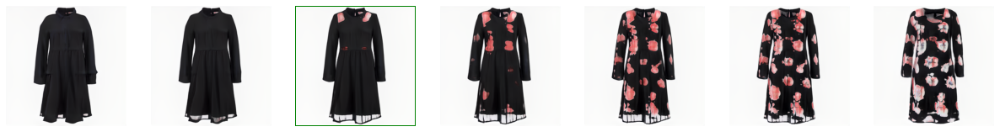

In [ ]:
direction_ind = [4]  # direction index 34 79 56 47
layers = [np.arange(3,9,1)]  # layers for adding the vector

visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-3,-1.5,0,1,2, 3,5])

model prepared
start sgd
tensor(0.0942, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0386, device='cuda:0', grad_fn=<MeanBackward0>)


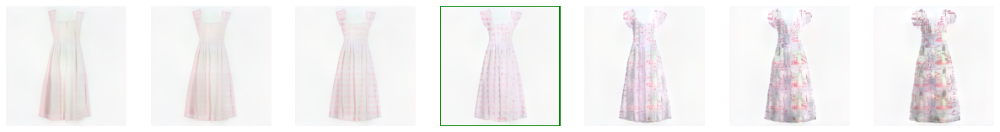

In [ ]:
direction_ind = [4]  # direction index 34 79 56 47
layers = [np.arange(3,9,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/white_pattern_dress.png"
visualize_magnititue_img_out(p, G, vectors, direction_ind, layers, magnititudes = [-5,-3,-1.5,0,3,5,7])

96


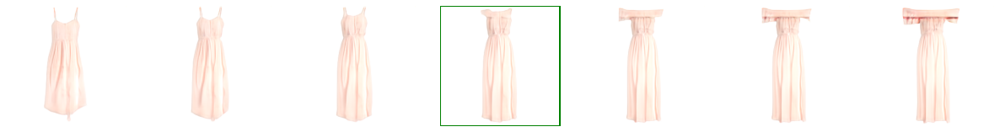

In [ ]:
direction_ind = [2]  # direction index 34 79 56 47
layers = [np.arange(0,7,1)]  # layers for adding the vector
visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-5, -3,-1.5,0,1, 1.5,2.5])

model prepared
start sgd
tensor(0.0990, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.2858, device='cuda:0', grad_fn=<MeanBackward0>)


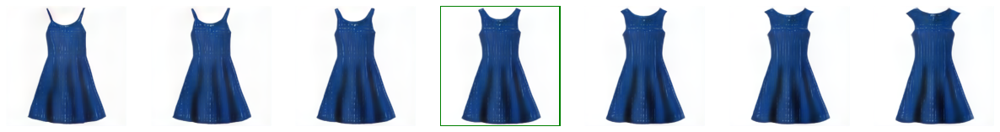

In [ ]:
direction_ind = [2]  # direction index 34 79 56 47
layers = [np.arange(0,7,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_polkadot_dress.png"
visualize_magnititue_img_out(p, G, vectors, direction_ind, layers, magnititudes = [-3,-2,-1,0,1, 1.5, 2.5])

47


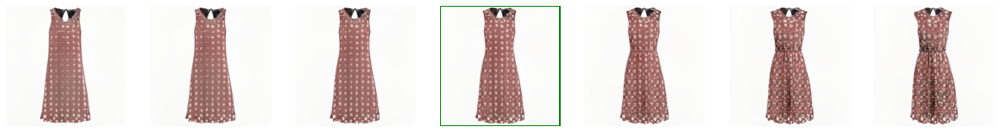

In [ ]:
direction_ind = [8]  # direction index 34 79 56 47
layers = [np.arange(3,4,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_polkadot_dress.png"
visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-15,-10,-5,0, 5, 10, 15])

model prepared
start sgd
tensor(0.0767, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0256, device='cuda:0', grad_fn=<MeanBackward0>)


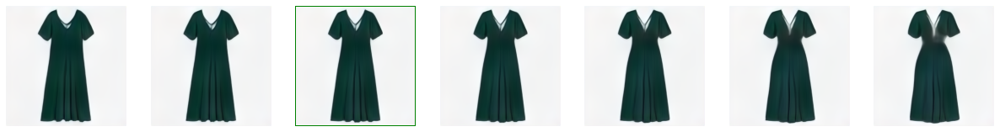

In [ ]:
direction_ind = [8]  # direction index 34 79 56 47
layers = [np.arange(3,4,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/green_dress.png"
visualize_magnititue_img_out(p,G, vectors, direction_ind, layers, magnititudes = [-15,-7,0, 5, 10, 15, 20])

22


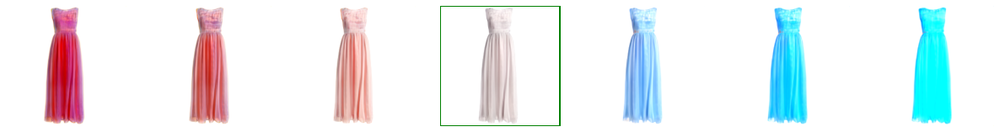

In [ ]:
direction_ind = [6]  # direction index 34 79 56 47
layers = [np.arange(10,14,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_polkadot_dress.png"
visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-15,-10,-5,0, 5, 10, 15])

model prepared
start sgd
tensor(0.0824, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0392, device='cuda:0', grad_fn=<MeanBackward0>)


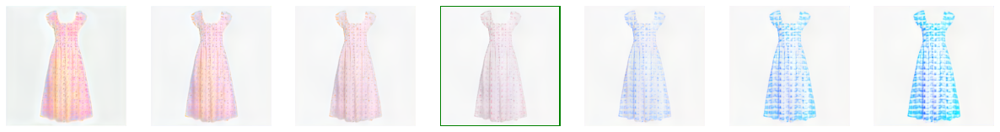

In [ ]:
direction_ind = [6]  # direction index 34 79 56 47
layers = [np.arange(10,14,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/white_pattern_dress.png"
visualize_magnititue_img_out(p, G, vectors, direction_ind, layers, magnititudes = [-15,-10,-5,0, 5, 10, 15])

13


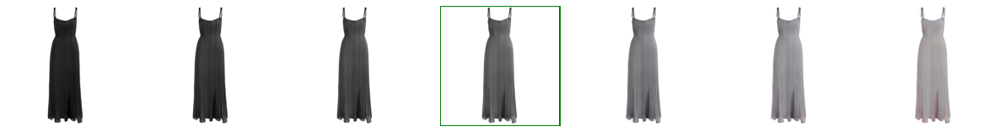

In [ ]:
direction_ind = [7]  # direction index 34 79 56 47
layers = [np.arange(10,14,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_polkadot_dress.png"
visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-20,-10,-5,0, 5, 10, 20])

model prepared
start sgd
tensor(0.0626, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0421, device='cuda:0', grad_fn=<MeanBackward0>)


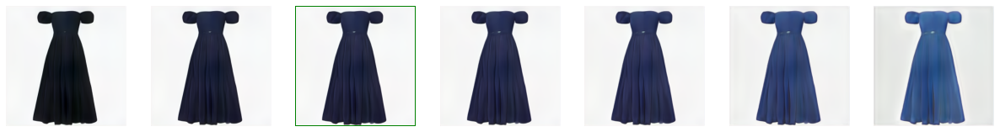

In [ ]:
direction_ind = [7]  # direction index 34 79 56 47
layers = [np.arange(10,14,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_sleeves_dress.png"
visualize_magnititue_img_out(p, G, vectors, direction_ind, layers, magnititudes = [-15,-5,0, 5, 10, 20, 30])

33


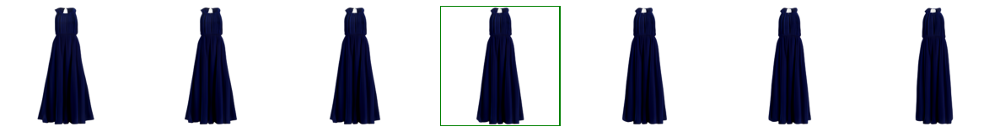

In [ ]:
direction_ind = [9]  # direction index 34 79 56 47
layers = [np.arange(0, 4,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_polkadot_dress.png"
visualize_magnititue_img_in(G, vectors, direction_ind, layers, magnititudes = [-10,-5,-3,0, 3, 5, 10])

model prepared
start sgd
tensor(0.0670, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0301, device='cuda:0', grad_fn=<MeanBackward0>)


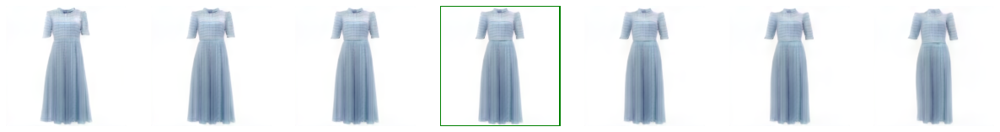

In [ ]:
direction_ind = [9]  # direction index 34 79 56 47
layers = [np.arange(0, 4,1)]  # layers for adding the vector
p = "/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/new_images/out_of_training_set_square/rich/blue_frilly_dress.png"
visualize_magnititue_img_out(p, G, vectors, direction_ind, layers, magnititudes = [-10,-5,-3,0, 3, 5, 10])

In [ ]:
img_p = "in00"
img = PIL.Image.open("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/result/pca/pca_direction_"+img_p+".png").convert('RGB')
W, H = img.size
W,H

(1512, 216)

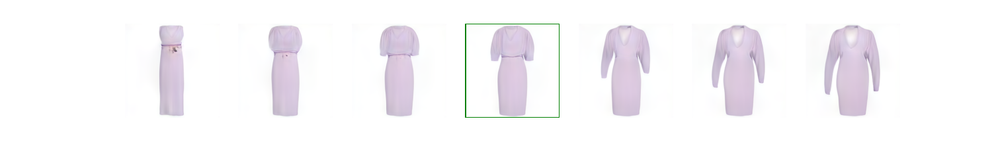

In [ ]:
img

In [ ]:
left = 170
top = 35
right = W-100
bottom = H-35

# Crop the center of the image
img = img.crop((left, top, right, bottom))

In [ ]:
img.size

(1242, 146)

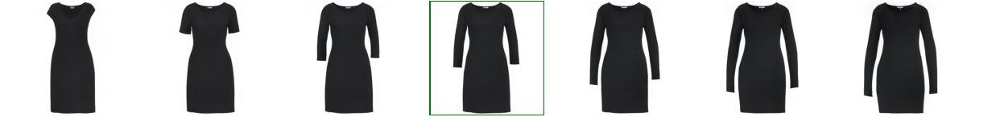

In [ ]:
img

In [ ]:
W = 256
H = 256
d = 25
imgs = ["13.jpg","11.jpg",  "green_robe_pattern.png", "lavendar_dress.png", "image_dalle_1.png", "bag.jpg",  "fangao.png",
        "generated_img_in2.png","generated_img_in_aux.png", "generated_img_out_aux.png", "generated_img_out3_aux.png", "image_dalle_1_aux.png",  "generated_bag_aux.png", "generated_img1_no_aux.png",
        "generated_img_in2_aux.png", "generated_img_in.png", "generated_img_out.png", "generated_img_out3.png","image_dalle_1_o.png","generated_bag.png","generated_img1.png"]
cols = len(imgs)//3
canvas = PIL.Image.new('RGB', ((W)*cols+d, (H+d)*3+d), 'white')

for i,img_p in enumerate(imgs):
    img = PIL.Image.open("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/result/projection/"+img_p).convert('RGB')
    canvas.paste(img, ((W) * (i%cols), (H+d) * (i//cols), (W) * (i%cols) + W, (H+d) * (i//cols)+H))
canvas.save(f'result/projection.png')
canvas.show()

In [ ]:
W = 1242
H = 146
d = -0
left = 170
top = 35
right = 1512-100
bottom = 216-35
imgs = ["in00","out00","in43","out43","in610","out610","in90","out90"]
imgs_2 = ["in20","out20","in710","out710","in83","out83"]
canvas = PIL.Image.new('RGB', (W, (H+d//2)*len(imgs)+d), 'white')

for i,img_p in enumerate(imgs):
    img = PIL.Image.open("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/result/pca/pca_direction_"+img_p+".png").convert('RGB')

    print(img.size)
    # Crop the center of the image
    img = img.crop((left, top, right, bottom))
    print(img.size)
    if i%2==0:
        d = -0
    else:
        d=0
    canvas.paste(img, (0, (H+d//2) * i, W,(H+d//2) * i+ H))
canvas.save(f'out/latent_space_exploration.png')
canvas.show()

(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)


In [ ]:
canvas = PIL.Image.new('RGB', (W, (H+d//2)*len(imgs_2)+d), 'white')
for i,img_p in enumerate(imgs_2):
    img = PIL.Image.open("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/result/pca/pca_direction_"+img_p+".png").convert('RGB')

    print(img.size)
    # Crop the center of the image
    img = img.crop((left, top, right, bottom))
    print(img.size)
    if i%2==0:
        d = -0
    else:
        d=0
    canvas.paste(img, (0, (H+d//2) * i, W,(H+d//2) * i+ H))
canvas.save(f'out/latent_space_exploration_2.png')
canvas.show()

(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)
(1512, 216)
(1242, 146)


Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


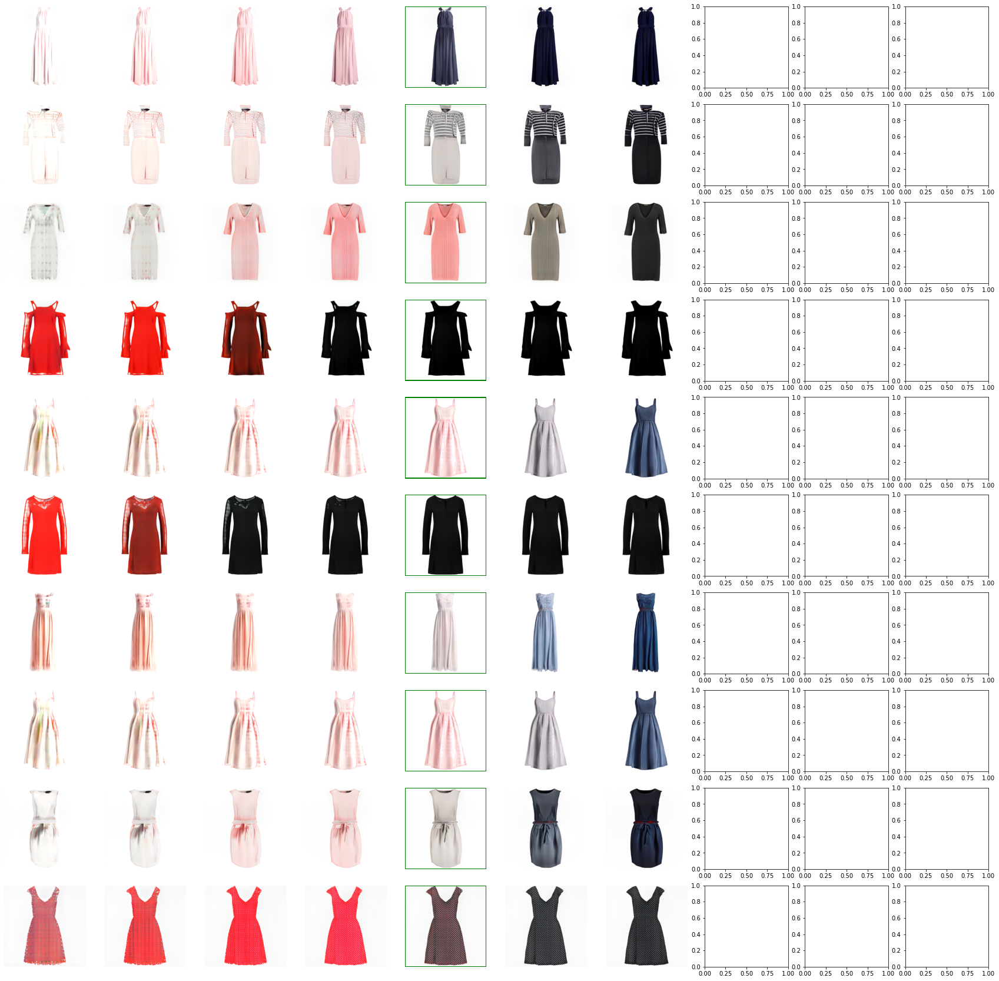

In [ ]:
direction_ind = [0]  # direction index
layers = [np.arange(7, 14, 1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers, magnititude = np.arange(-16, 10, 4))

Color decay

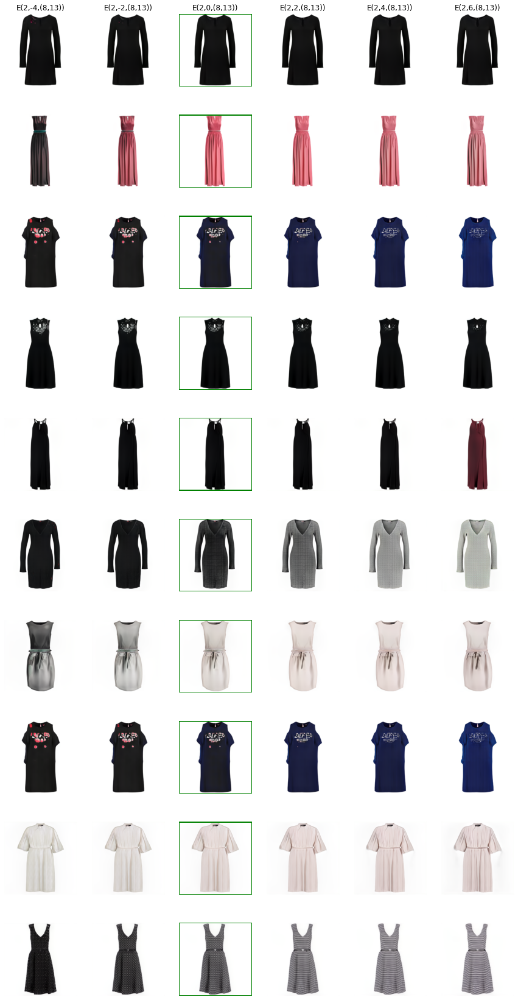

In [ ]:
direction_ind = [2]  # direction index
layers = [np.arange(7, 13, 1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

Pattern in the middle layer in vector 4

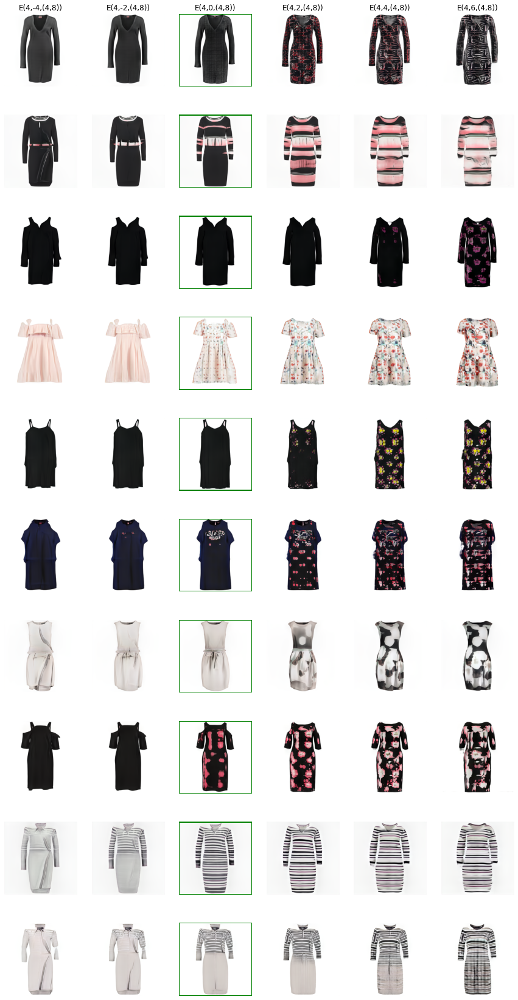

In [ ]:
direction_ind = [4]  # direction index
layers = [np.arange(3,8,1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

3: wider

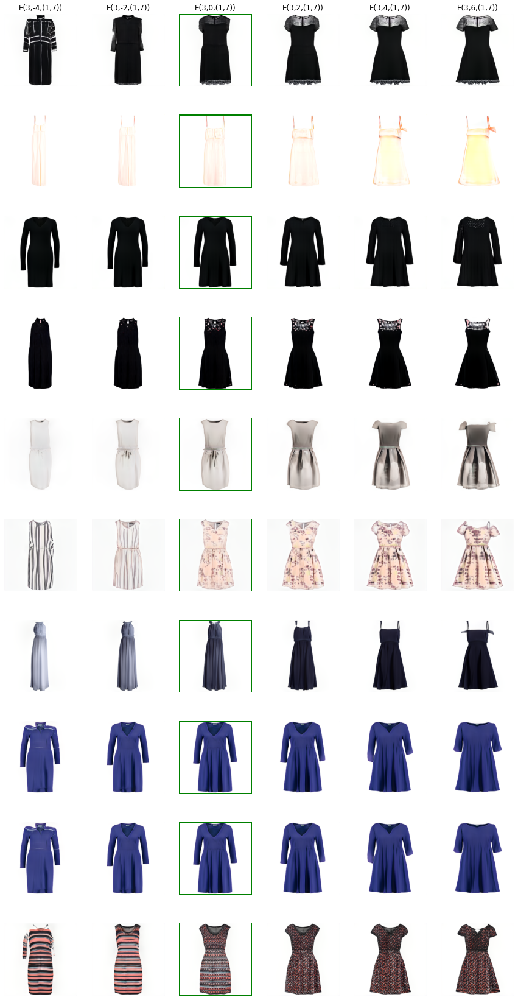

In [ ]:
direction_ind = [3]  # direction index
layers = [np.arange(0,7,1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

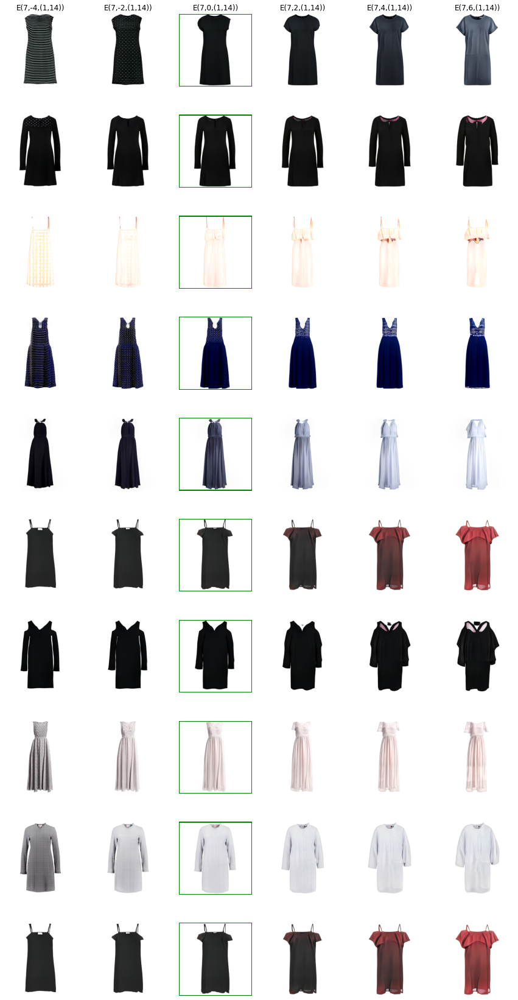

In [ ]:
direction_ind = [7]  # direction index
layers = [np.arange(0,14,1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

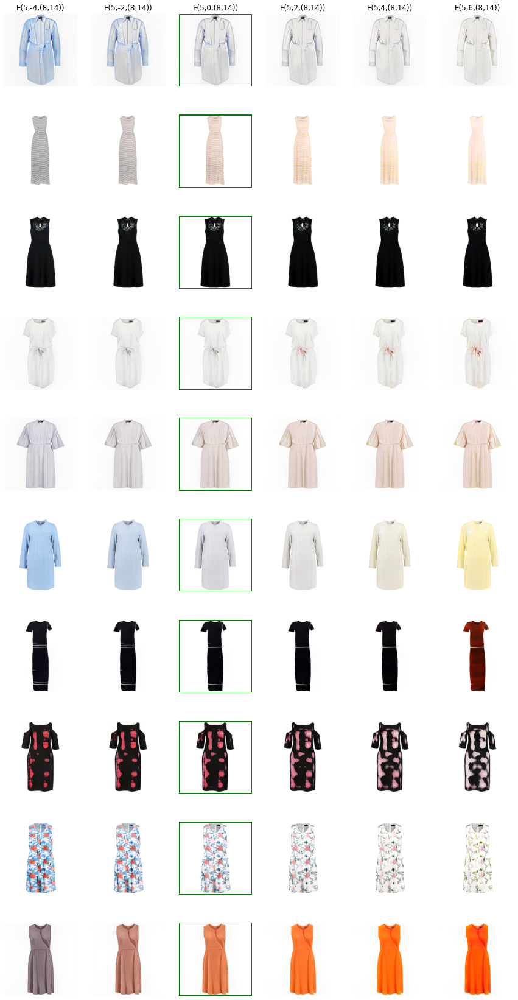

In [ ]:
direction_ind = [5]  # direction index
layers = [np.arange(7,14,1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

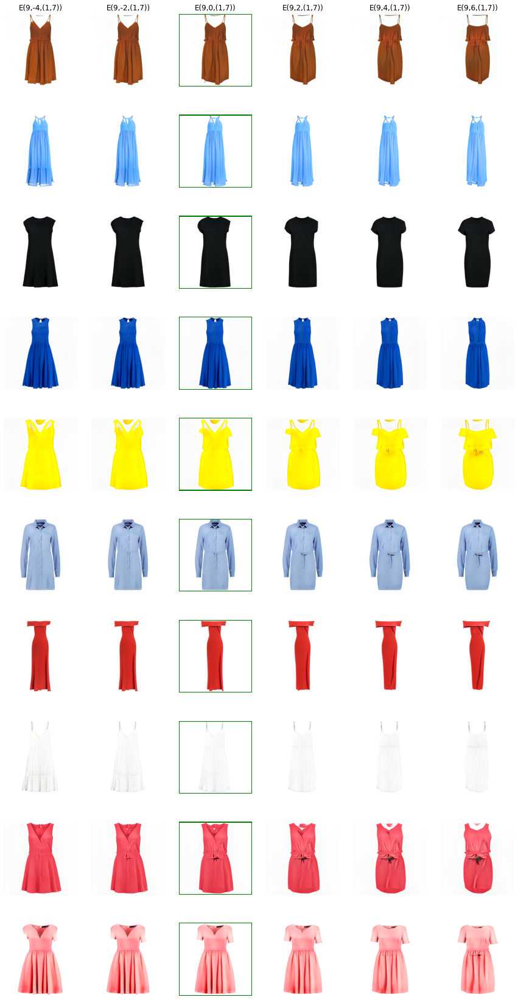

In [ ]:
direction_ind = [9]  # direction index
layers = [np.arange(0,7,1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

#### Directly modify images

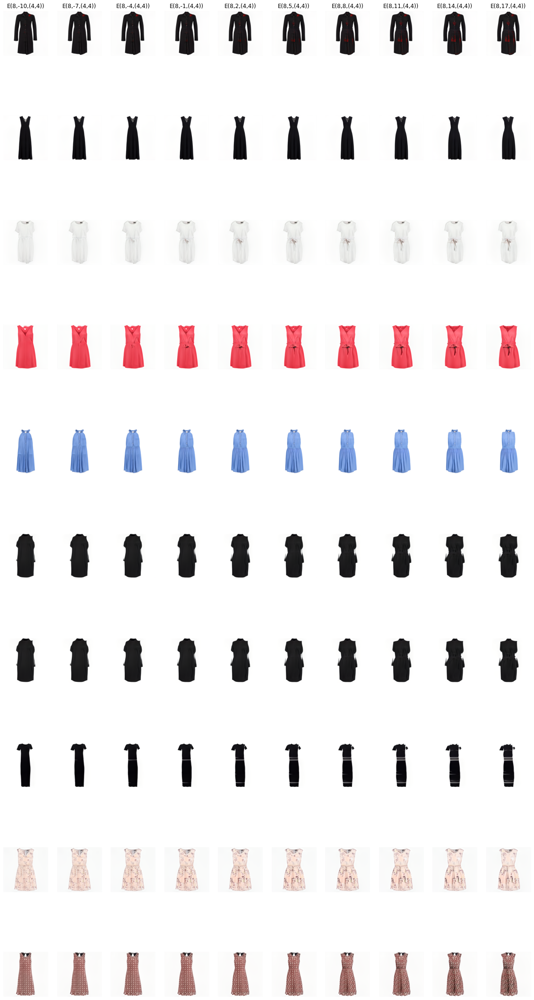

In [ ]:
direction_ind = [8]  # direction index 11
layers = [np.arange(3, 4, 1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers, magnititude=np.arange(-10, 20, 3))

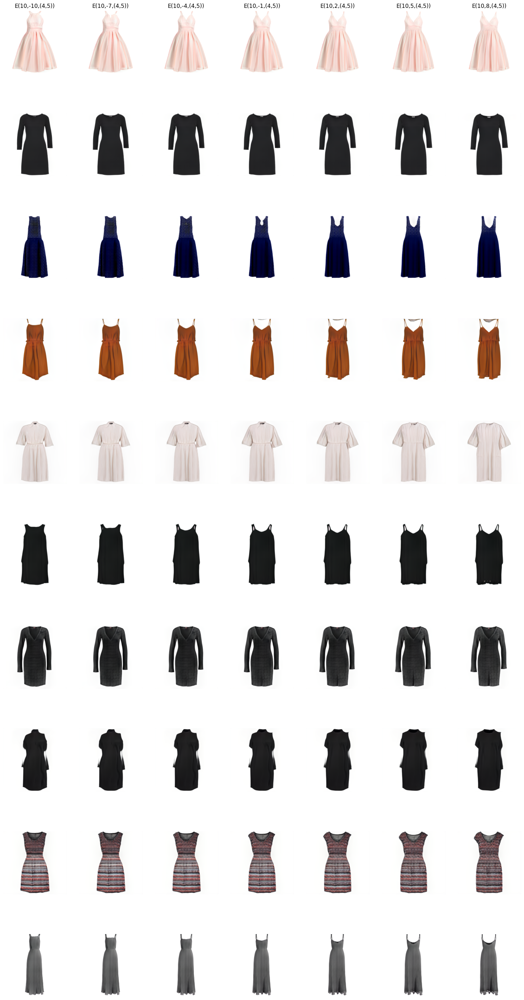

In [ ]:
direction_ind = [10]  # direction index
layers = [np.arange(3,5,1)]  # layers for adding the vector
visualize_magnititue(G, vectors, direction_ind, layers)

In [ ]:
w_origin = img_to_w(image)
w_origin.shape

Computing W midpoint and stddev using 10000 samples...
step 1000/1000: dist 0.04 loss 0.04 


torch.Size([1000, 14, 512])

Computing W midpoint and stddev using 10000 samples...
step 1000/1000: dist 0.04 loss 0.04 
torch.Size([1, 14, 512])


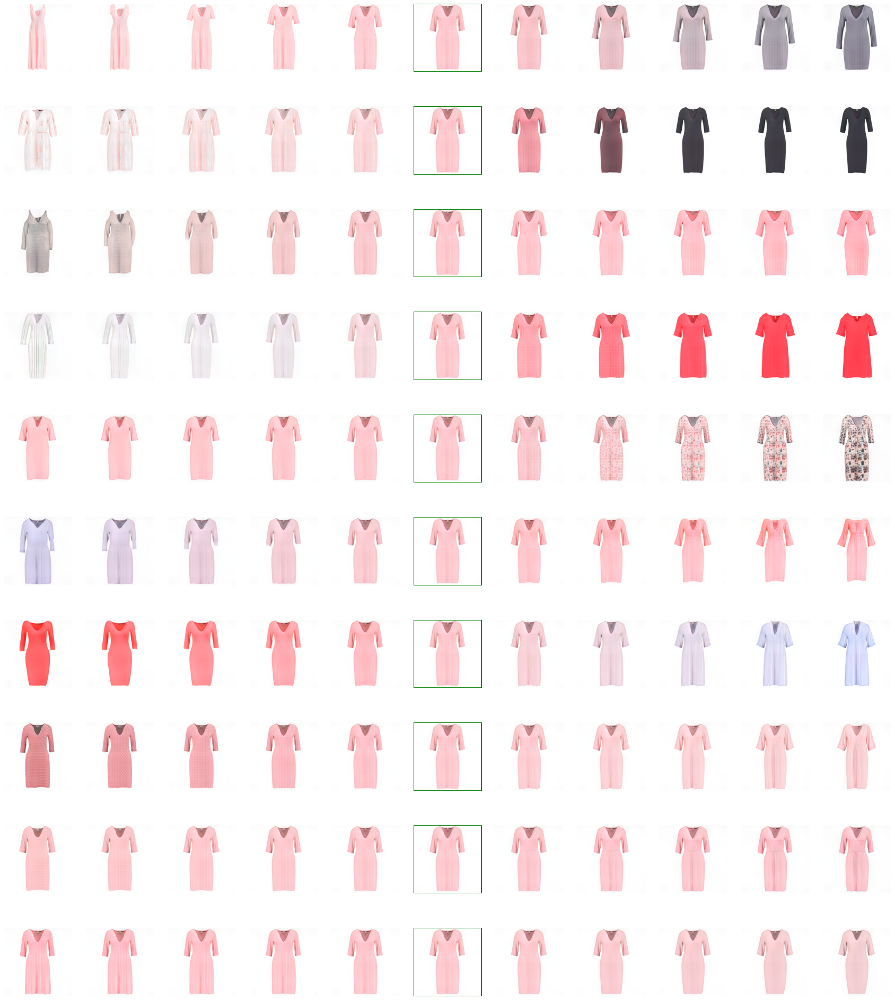

In [ ]:
target = "out/10-10.png"
layers = [np.arange(0,14,1)]
image = target_pil = PIL.Image.open(target).convert('RGB')
visualize_img_changes(image, vectors, layers)

Computing W midpoint and stddev using 10000 samples...
step 1000/1000: dist 0.02 loss 0.02 
torch.Size([1, 14, 512])


NameError: ignored

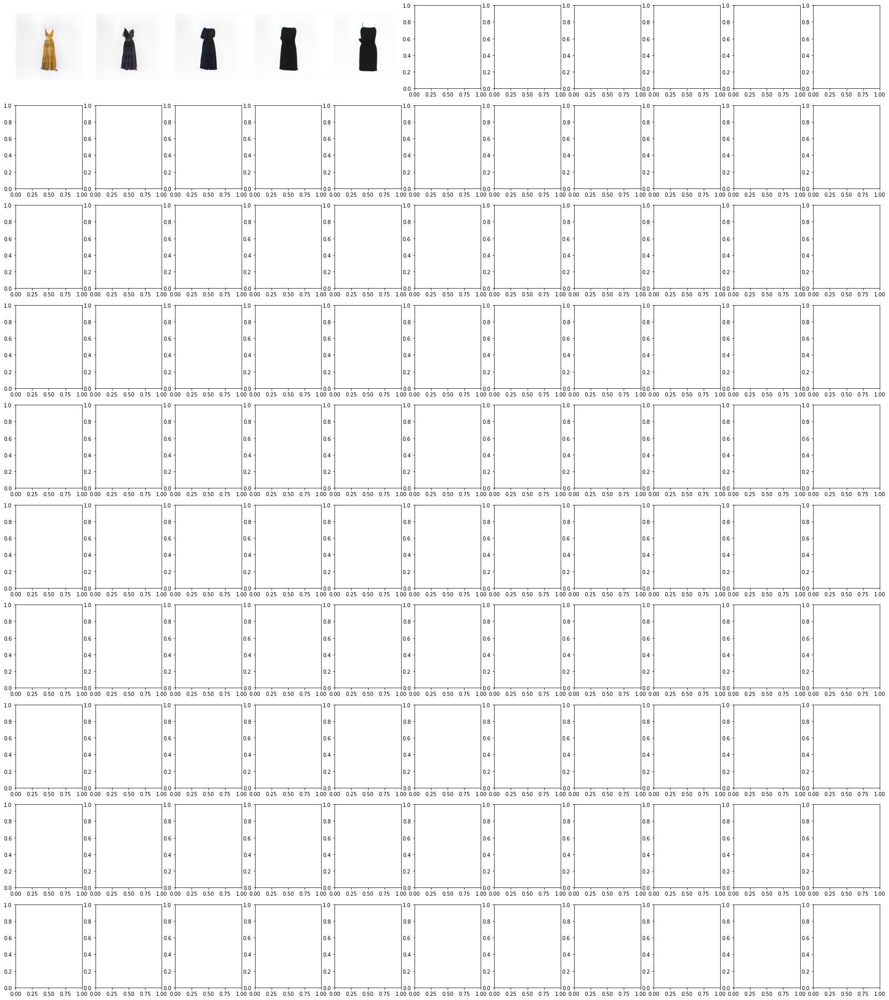

In [ ]:
target = "out/out_of_training_set_dress_1.png"
layers = [np.arange(0,14,1)]
image = target_pil = PIL.Image.open(target).convert('RGB')
visualize_img_changes(image, vectors, layers)

In [ ]:
target = "out/out_of_training_set_dress_1.png"
layers = [np.arange(0,14,1)]
image = target_pil = PIL.Image.open(target).convert('RGB')
visualize_img_changes(image, vectors, layers)

In [ ]:
target = "out/10-10.png"
layers = [np.arange(0,14,1)]
image = target_pil = PIL.Image.open(target).convert('RGB')
visualize_img_changes(image, vectors, layers, noise_mode = 'const')

Style mixing

In [ ]:
#@title Default title text
# Style mixing example
!python style_mixing.py --outdir=out --rows=200,10,75,408,500 --cols=55,801,189,90 --network="$network"

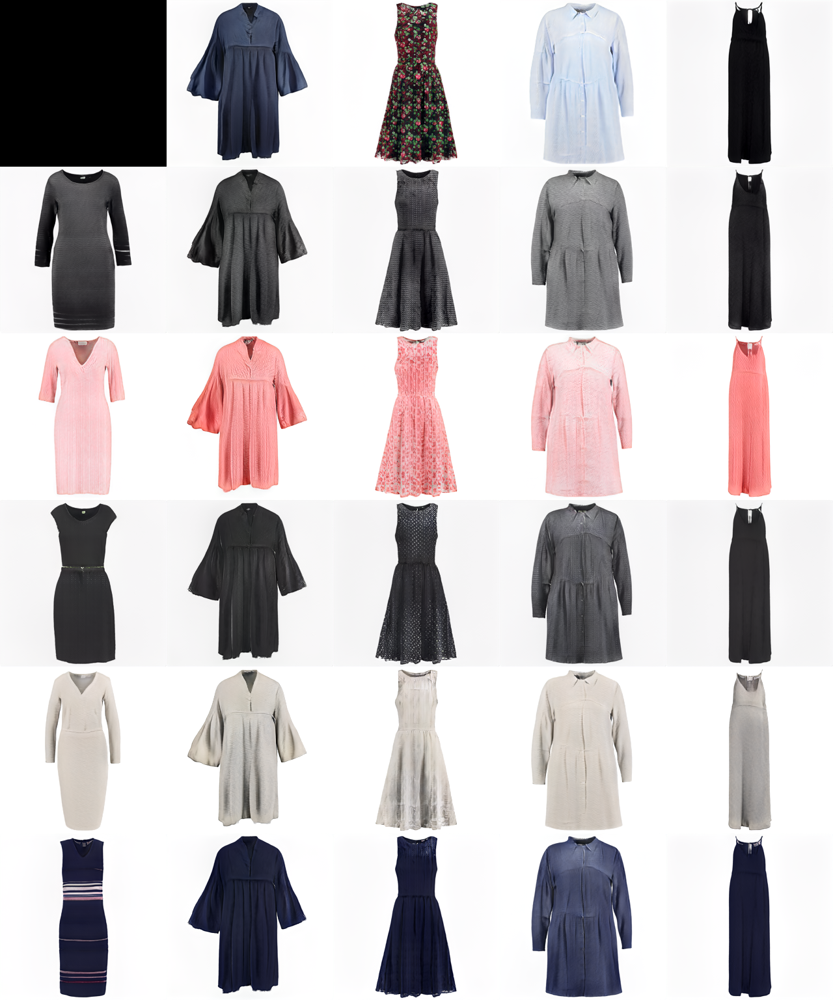

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/grid.png")
cv2_imshow(img)

We can see the clothing in row controls coarse feature like shape and the column sourse controls color.



1. From image to latent space

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png")
img[img>240] = 255
cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png", img)

True

In [ ]:
 !python projector.py --outdir=latent-space --target="out/500-93_no_sleeve.png" --network="$network" --save-video False
!python projector.py --outdir=latent-space --target="out/200-801.png" --network="$network" --save-video False
!python projector.py --outdir=latent-space --target="out/200-90.png" --network="$network" --save-video False

Generate image from  of the projected w

In [ ]:
!python generate.py --outdir=latent-space --projected-w="latent-space/project_500-93.npz" --network="$network"

Loading networks from "/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/training_runs/00011-square_256_imgs-auto1-resumecustom/network-snapshot-004080.pkl"...
Generating images from projected W "latent-space/project_500-93.npz"
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


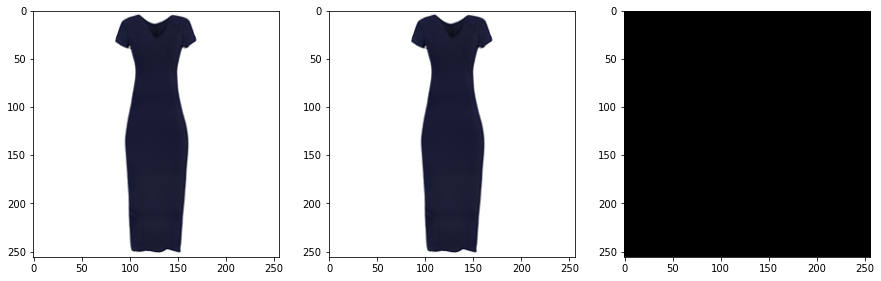

In [ ]:
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png"),cv2.COLOR_BGR2RGB)
img_projected = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/latent-space/500-93_target.png"),cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(1,3,figsize=(15,20))
axs[0].imshow(img_original)
axs[1].imshow(img_projected)
axs[2].imshow(img_original-img_projected)
plt.show()

It is the same which makes sense.

In [ ]:
def latent_space_to_img(ws, network):
    device = torch.device('cuda')
    noise_mode = 'const'
    network_pkl = network
    with dnnlib.util.open_url(network_pkl) as f:
        G = legacy.load_network_pkl(f)['G_ema'].to(device) # type: ignore
    ws = torch.tensor(ws, device=device) # pylint: disable=not-callable
    assert ws.shape[1:] == (G.num_ws, G.w_dim)
    for idx, w in enumerate(ws):
        img = G.synthesis(w.unsqueeze(0), noise_mode=noise_mode)
        img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return img.cpu().numpy()[0]

#### Simple arithmetic: Sleeve - No Sleeve + New No Sleeve = New Sleeve

They have mixed feature: Color and sleeve. Let's try to eliminate color feature by setting all the cothing color as black.

In [ ]:
# img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png")
# img[img<255] = 0
# cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_black.png", img)
# img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_no_sleeve.png")
# img[img<255] = 0
# cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_no_sleeve_black.png", img)
# img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png")
# img[img>240] = 255
# img[img<255]=0
# cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801_black.png", img)
# !python projector.py --outdir=latent-space --target="out/500-93_black.png" --network="$network" --save-video False
# !python projector.py --outdir=latent-space --target="out/500-93_no_sleeve_black.png" --network="$network" --save-video False
# !python projector.py --outdir=latent-space --target="out/200-801_black.png" --network="$network" --save-video False

### Testing samples inside in the training set

In [ ]:
sleeve = np.load("latent-space/project_500-93_black.npz")["w"]
no_sleeve = np.load("latent-space/project_500-93_no_sleeve_black.npz")["w"]
new_no_sleeve_1 = np.load("latent-space/project_200-801.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_10-23.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_200-90.npz")["w"]

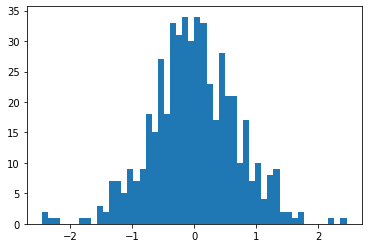

array([271, 366, 314, 407, 506, 105, 475, 193, 360, 353])

In [ ]:
diff = sleeve - no_sleeve
plt.hist(diff[0,0], bins = 50)
plt.show()
ind = np.argpartition(np.abs(diff[0, 0]), -20)[-10:]
ind

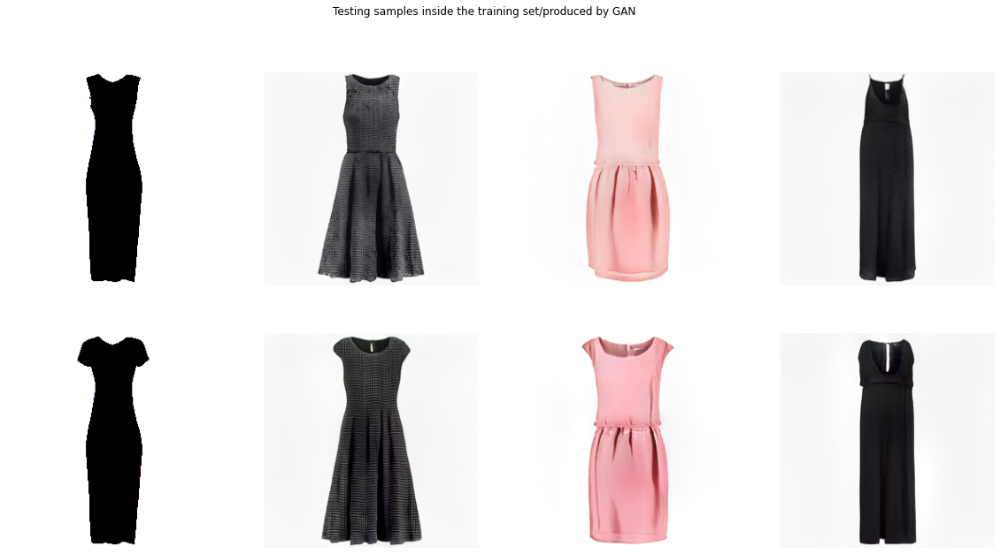

In [ ]:
# diff = sleeve - no_sleeve
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = sleeve - no_sleeve + new_no_sleeve_1
ws_2 = sleeve - no_sleeve + new_no_sleeve_2
ws_3 = sleeve - no_sleeve + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_black.png"),cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_original)
axs[1,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_no_sleeve_black.png"), cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_no_sleeve)
axs[0,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

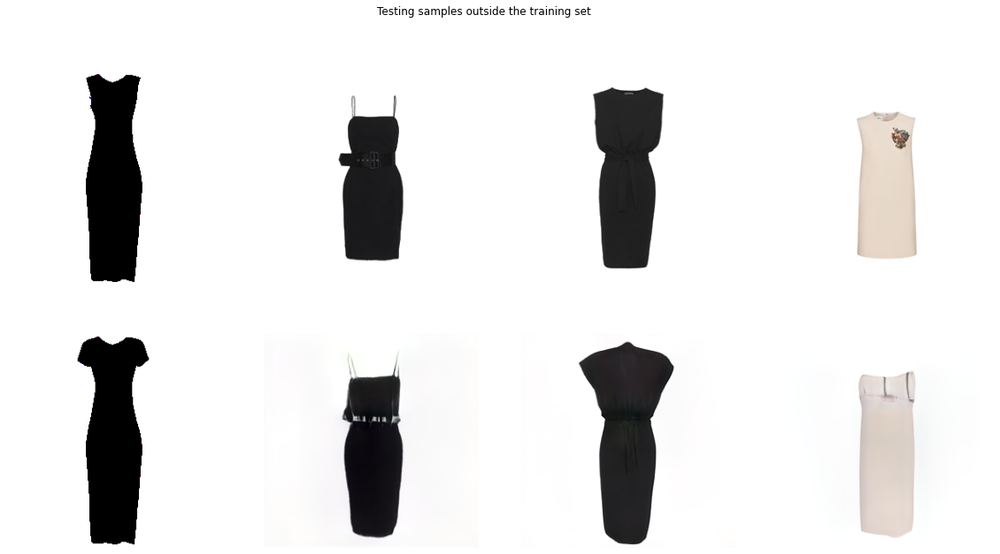

In [ ]:
new_no_sleeve_1 = np.load("latent-space/project_out_of_training_set_dress_1.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_out_of_training_set_dress_2.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_out_of_training_set_dress_3.npz")["w"]
ws_1 = sleeve - no_sleeve + new_no_sleeve_1
ws_2 = sleeve - no_sleeve + new_no_sleeve_2
ws_3 = sleeve - no_sleeve + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples outside the training set")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_black.png"),cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_original)
axs[1,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_no_sleeve_black.png"), cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_no_sleeve)
axs[0,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_1.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_3.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

**Can we take the sleeve off??  TODO: Explore how to take the sleeve off**

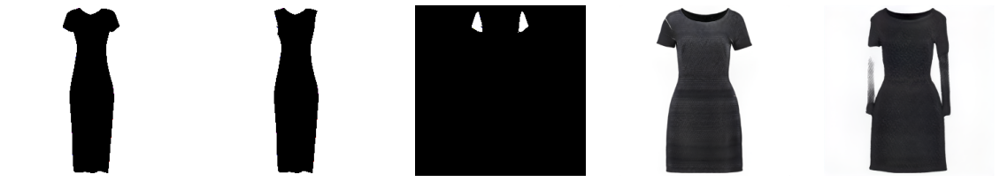

In [ ]:
ws_1 = no_sleeve - sleeve + new_sleeve_1
fig, axs = plt.subplots(1,5,figsize=(20,10))
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_black.png"),cv2.COLOR_BGR2RGB)
axs[0].imshow(img_original)
axs[0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_no_sleeve_black.png"), cv2.COLOR_BGR2RGB)
axs[1].imshow(img_no_sleeve)
axs[1].axis('off')
axs[2].imshow(-img_original + img_no_sleeve)
axs[2].axis('off')
axs[3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/seed0604.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[3].axis('off')
axs[4].imshow(diff_sleeve_1)
axs[4].axis('off')
plt.show()

### color feature

In [ ]:
black = np.load("latent-space/project_500-93_black.npz")["w"]
blue = np.load("latent-space/project_500-93.npz")["w"]

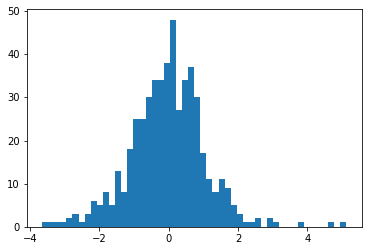

array([259, 291, 166, 423, 506, 463, 216,  49, 276, 382])

In [ ]:
diff = blue - black
plt.hist(diff[0,0], bins = 50)
plt.show()
ind = np.argpartition(np.abs(diff[0, 0]), -20)[-10:]
ind

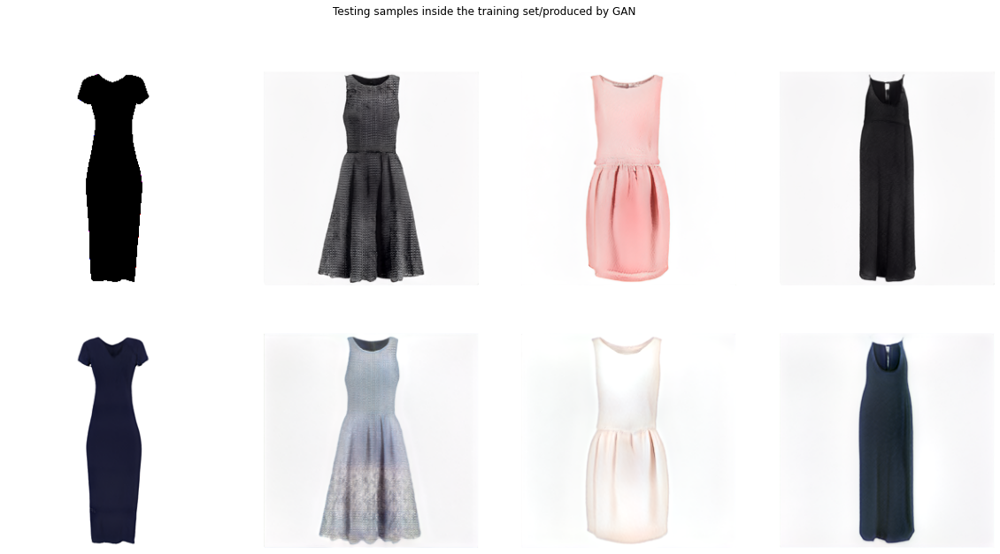

In [ ]:
diff = blue - black
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_black.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

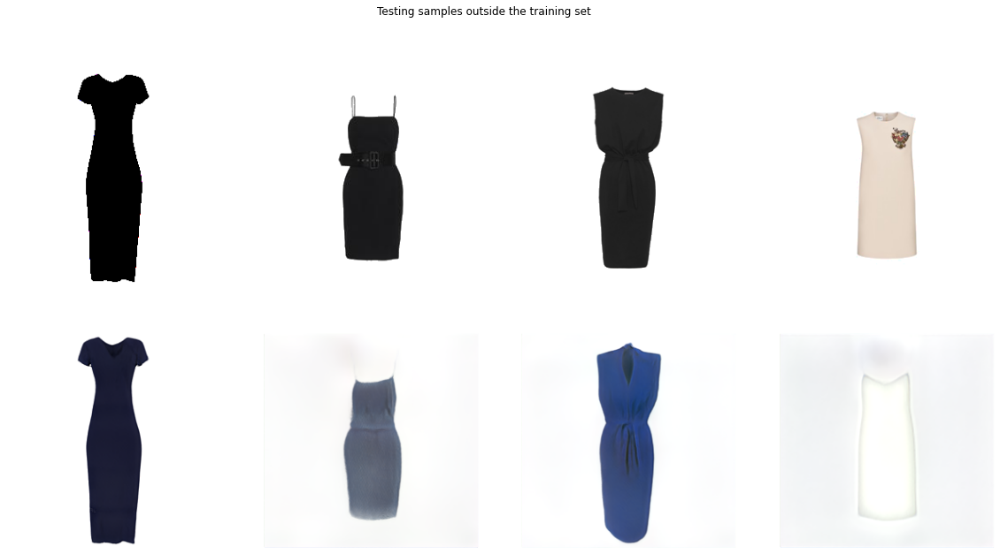

In [ ]:
diff = blue - black
new_no_sleeve_1 = np.load("latent-space/project_out_of_training_set_dress_1.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_out_of_training_set_dress_2.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_out_of_training_set_dress_3.npz")["w"]
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples outside the training set")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_black.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_1.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_3.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

###Length Feature

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png")
img.shape

(256, 256, 3)

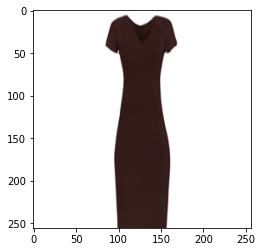

In [ ]:
resize = cv2.resize(img[:200,:,:],(256,256))
plt.imshow(resize)
#cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_short.png", img)

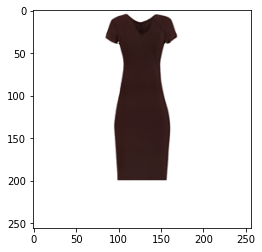

In [ ]:
plt.imshow(img)

In [ ]:
!python projector.py --outdir=latent-space --target="out/500-93_short.png" --network="$network" --save-video False

In [ ]:
short = np.load("latent-space/project_500-93_short.npz")["w"]
original = np.load("latent-space/project_500-93.npz")["w"]

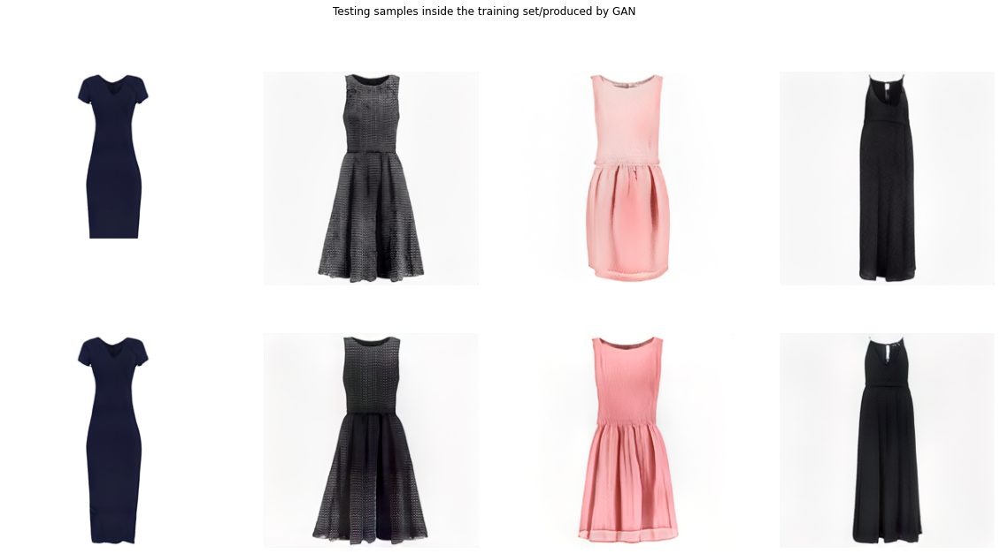

In [ ]:
diff = original - short
new_no_sleeve_1 = np.load("latent-space/project_200-801.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_10-23.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_200-90.npz")["w"]
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_short.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

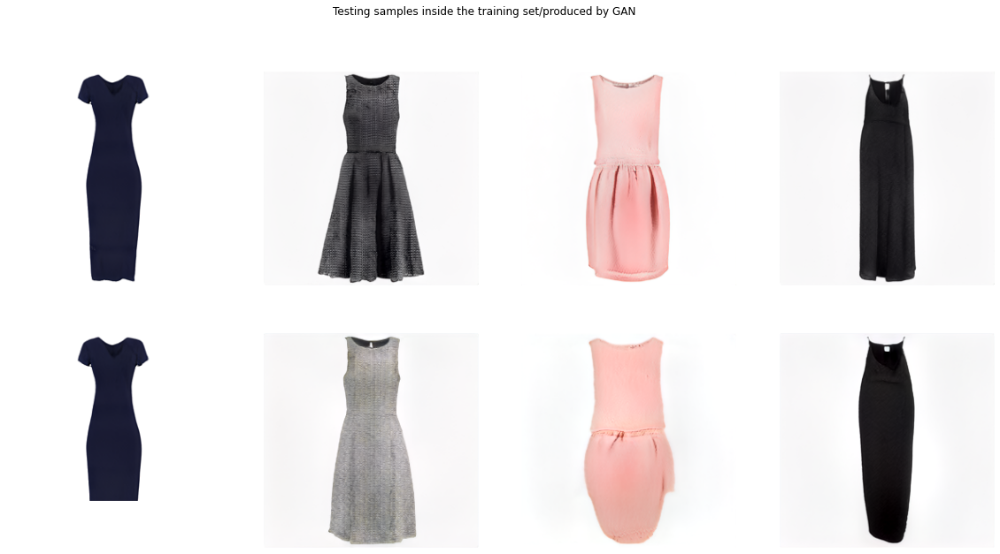

In [ ]:
diff = short - original
new_no_sleeve_1 = np.load("latent-space/project_200-801.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_10-23.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_200-90.npz")["w"]
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_short.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

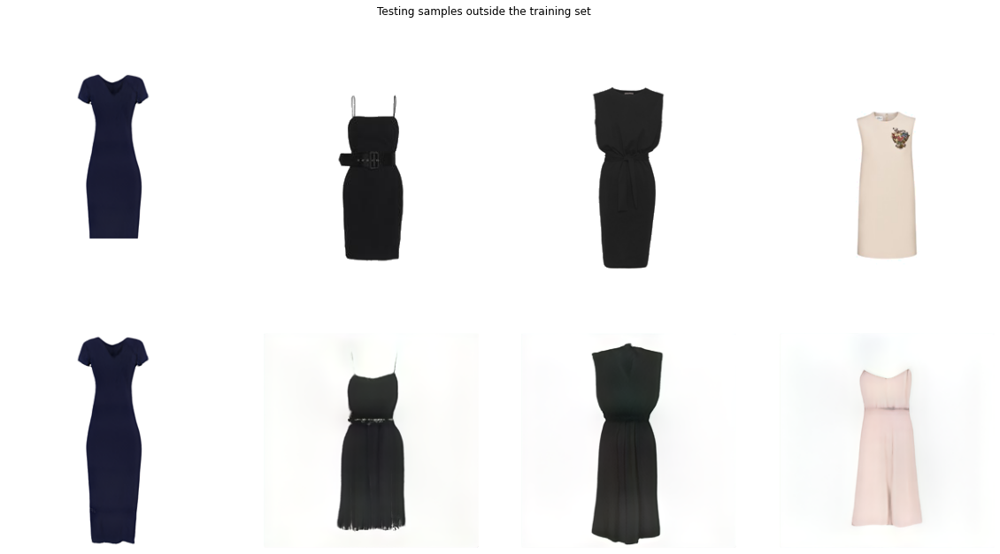

In [ ]:
diff = original - short
new_no_sleeve_1 = np.load("latent-space/project_out_of_training_set_dress_1.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_out_of_training_set_dress_2.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_out_of_training_set_dress_3.npz")["w"]
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples outside the training set")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png"),cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_original)
axs[1,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93_short.png"), cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_no_sleeve)
axs[0,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_1.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_3.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

###Pattern

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/25-25.png")

In [ ]:
img[img<255] = [255]

In [ ]:
img[img>240] = 255
img[img<40] = 0

In [ ]:
cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_without_pattern_2.png", img)

True

In [ ]:
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        if np.sum(img[i,j,:])<255*3:
            img[i,j,:] = [0]

In [ ]:
!python projector.py --outdir=latent-space --target="out/img_with_pattern_2.png" --network="$network" --save-video False

In [ ]:
!python projector.py --outdir=latent-space --target="out/img_without_pattern_2.png" --network="$network" --save-video False

In [ ]:
pattern = np.load("latent-space/project_img_with_pattern_1.npz")["w"]
no_pattern = np.load("latent-space/project_img_without_pattern_1.npz")["w"]

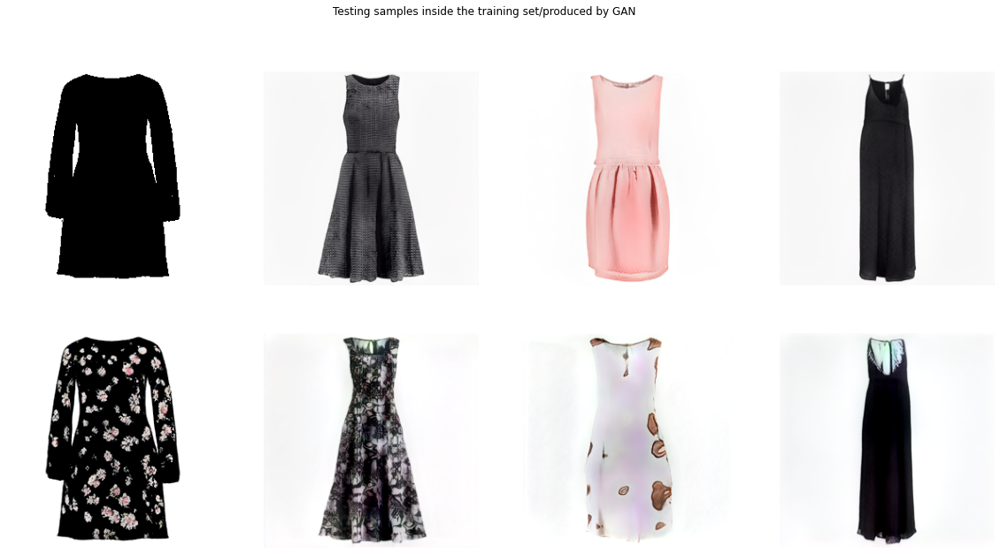

In [ ]:
diff = pattern - no_pattern
new_no_sleeve_1 = np.load("latent-space/project_200-801.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_10-23.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_200-90.npz")["w"]
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_without_pattern_1.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_with_pattern_1.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

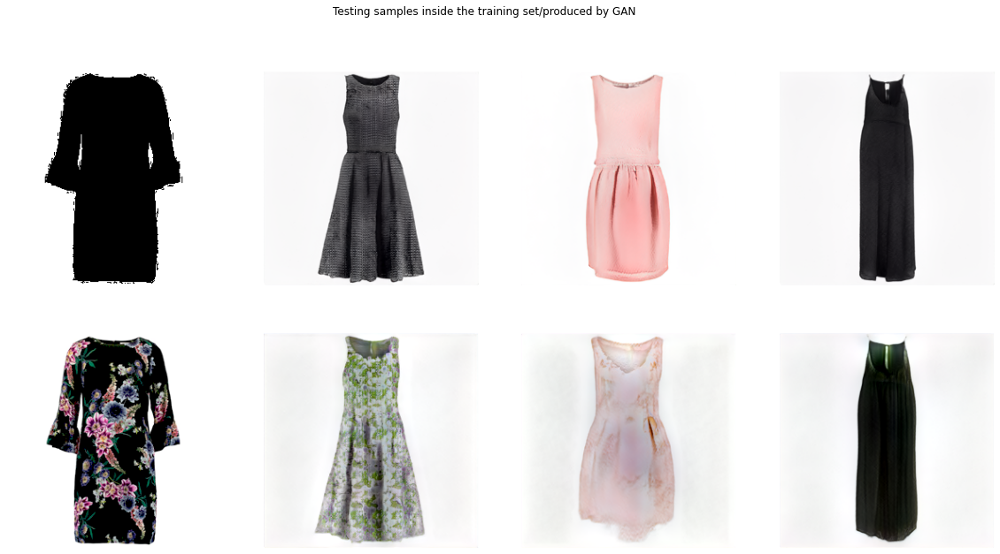

In [ ]:
pattern = np.load("latent-space/project_img_with_pattern.npz")["w"]
no_pattern = np.load("latent-space/project_img_without_pattern.npz")["w"]
diff = pattern - no_pattern
new_no_sleeve_1 = np.load("latent-space/project_200-801.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_10-23.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_200-90.npz")["w"]
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_without_pattern.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_with_pattern.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

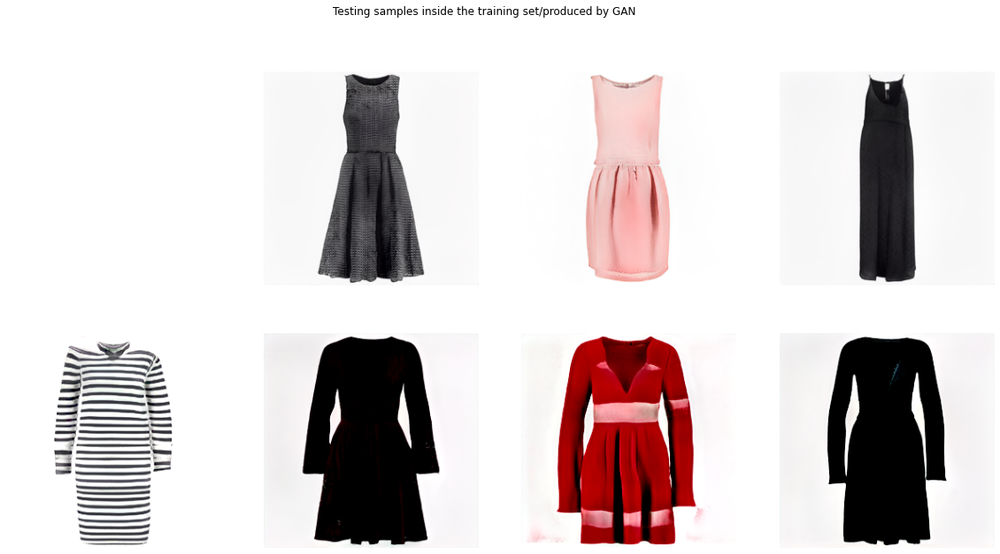

In [ ]:
pattern = np.load("latent-space/project_img_with_pattern_2.npz")["w"]
no_pattern = np.load("latent-space/project_img_without_pattern_2.npz")["w"]
diff = pattern - no_pattern
new_no_sleeve_1 = np.load("latent-space/project_200-801.npz")["w"]
new_no_sleeve_2 = np.load("latent-space/project_10-23.npz")["w"]
new_no_sleeve_3 = np.load("latent-space/project_200-90.npz")["w"]
# diff[(np.abs(diff)<0.5)&(np.abs(diff)>1)] =0 # set 0.5 should work
ws_1 = diff + new_no_sleeve_1
ws_2 = diff + new_no_sleeve_2
ws_3 = diff + new_no_sleeve_3
fig, axs = plt.subplots(2,4,figsize=(20,10))
fig.suptitle("Testing samples inside the training set/produced by GAN")
img_original = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_without_pattern_2.png"),cv2.COLOR_BGR2RGB)
axs[0,0].imshow(img_original)
axs[0,0].axis('off')
img_no_sleeve = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/img_with_pattern_2.png"), cv2.COLOR_BGR2RGB)
axs[1,0].imshow(img_no_sleeve)
axs[1,0].axis('off')
axs[0,1].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_1 = latent_space_to_img(ws_1, network)
axs[0,1].axis('off')
axs[1,1].imshow(diff_sleeve_1)
axs[1,1].axis('off')
axs[0,2].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/10-23.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_2 = latent_space_to_img(ws_2, network)
axs[0,2].axis('off')
axs[1,2].imshow(diff_sleeve_2)
axs[1,2].axis('off')
axs[0,3].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-90.png"), cv2.COLOR_BGR2RGB))
diff_sleeve_3 = latent_space_to_img(ws_3, network)
axs[0,3].axis('off')
axs[1,3].imshow(diff_sleeve_3)
axs[1,3].axis('off')
plt.show()

### Let us take a look of one dimemsion to see changes

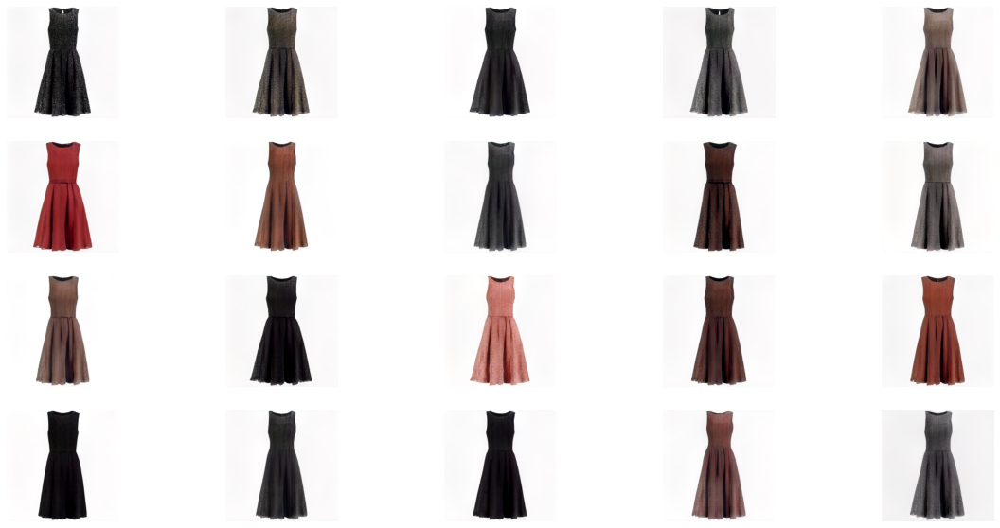

In [ ]:
n = 20
c = n//4
fig, axs = plt.subplots(4,c,figsize=(20,10))
axs[0,0].imshow(cv2.cvtColor(cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/200-801.png"), cv2.COLOR_BGR2RGB))
axs[0,0].axis('off')
for i in range(n):
    ws_1= new_no_sleeve_1.copy()
    ws_1[:,:,i] +=10
    diff_sleeve_1 = latent_space_to_img(ws_1, network)
    axs[i//c, i%c].imshow(diff_sleeve_1)
    axs[i//c, i%c].axis('off')
plt.show()

##### Show in video

In [ ]:
dim = 1
steps = np.arange(-40, 40, 0.5)
video = imageio.get_writer(f'latent-space/proj_{dim}.mp4', mode='I', fps=10, codec='libx264', bitrate='16M')
device = torch.device('cuda')
noise_mode = 'const'
network_pkl = network
with dnnlib.util.open_url(network_pkl) as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device) # type: ignore
sleeve_1 = latent_space_to_img(ws_1, network)
for step in steps:
    ws_1= new_no_sleeve_1.copy()
    ws_1[:,:,dim] += step
    ws = torch.tensor(ws_1, device=device) # pylint: disable=not-callable
    assert ws.shape[1:] == (G.num_ws, G.w_dim)
    for idx, w in enumerate(ws):
        img = G.synthesis(w.unsqueeze(0), noise_mode=noise_mode)
        img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    video.append_data(img[0].cpu().numpy())
video.close()

In [ ]:
# from PIL import Image
# import math
# # Open the blank image and the image to resize
# background = Image.open('/content/drive/MyDrive/Colab Notebooks/Wei/feidegger/data/blank.jpg')
# image = Image.open('/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.jpg')

# # Uncomment to have Colab show the image
# # image

# print(image.size)
# # Resize image
# image.thumbnail((256, 256))
# print(image.size)
# # Paste image into center of background
# position_x = math.floor((256 - image.width) / 2)
# position_y = math.floor((256 - image.height) / 2)
# background.paste(image, (position_x, position_y))

# # Save new, square image
# background.save('/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.png')

# # Uncomment to see the new image
# background

In [ ]:
# img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.png")
# img[img>210] = 255
# #img[img<255]=0
# cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/out_of_training_set_dress_2.png", img)

In [ ]:
# !python projector.py --outdir=latent-space --target="out/out_of_training_set_dress_2.png" --network="$network" --save-video False

### Obtain landmark of the clothes to achieve the automatic "PS"

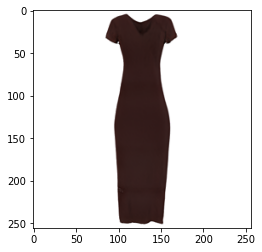

In [ ]:
image = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Wei/stylegan2-ada-pytorch/out/500-93.png")
plt.imshow(image)

In [ ]:
# import the necessary packages
import imutils
# load the image, convert it to grayscale, and blur it slightly
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)
# threshold the image, then perform a series of erosions +
# dilations to remove any small regions of noise
thresh = cv2.threshold(gray, 45, 256, cv2.THRESH_BINARY_INV)[1]
# thresh = cv2.erode(thresh, None, iterations=2)
# thresh = cv2.dilate(thresh, None, iterations=2)
# find contours in thresholded image, then grab the largest
# one
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

In [ ]:
# determine the most extreme points along the contour
extLeft = tuple(c[c[:, :, 0].argmin()][0])
extRight = tuple(c[c[:, :, 0].argmax()][0])
extTop = tuple(c[c[:, :, 1].argmin()][0])
extBot = tuple(c[c[:, :, 1].argmax()][0])

In [ ]:
tuple(c[c[:, :, 1].argmin()][0])

(108, 5)

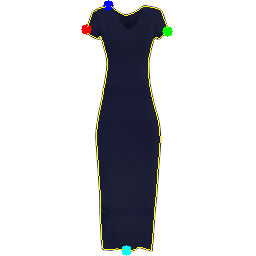

-1

In [ ]:
# draw the outline of the object, then draw each of the
# extreme points, where the left-most is red, right-most
# is green, top-most is blue, and bottom-most is teal
cv2.drawContours(image, [c], -1, (0, 255, 255), 1)
cv2.circle(image, extLeft, 3, (0, 0, 255), -1)
cv2.circle(image, extRight, 3, (0, 255, 0), -1)
cv2.circle(image, extTop, 3, (255, 0, 0), -1)
cv2.circle(image, extBot, 3, (255, 255, 0), -1)
# show the output image
cv2_imshow(image)
cv2.waitKey(0)

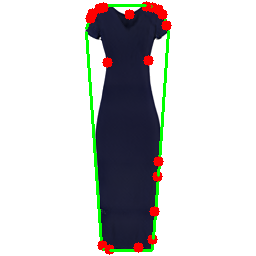

In [ ]:

ret, thresh = cv2.threshold(gray, 127, 256, cv2.THRESH_BINARY_INV)
contours,hierarchy = cv2.findContours(thresh,2,1)
cnt = contours[0]

hull = cv2.convexHull(cnt,returnPoints = False)
defects = cv2.convexityDefects(cnt,hull)

for i in range(defects.shape[0]):
    s,e,f,d = defects[i,0]
    start = tuple(cnt[s][0])
    end = tuple(cnt[e][0])
    far = tuple(cnt[f][0])
    cv2.line(image,start,end,[0,255,0],2)
    cv2.circle(image,far,5,[0,0,255],-1)
cv2_imshow(image)


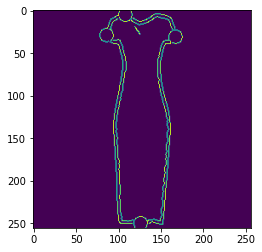

In [ ]:
edges = cv2.Canny(image,100,70)
plt.imshow(edges>150)

In [ ]:
# num_range('0-6')
# def mix_two_ws(w1, w2, )
# w = sleeve
# w[col_styles] = w_dict[col_seed][col_styles]
# image = G.synthesis(w[np.newaxis], noise_mode=noise_mode)